# Рынок заведений общественного питания Москвы

# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят меня, как аналитика, подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Мне доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Описание данных

Файл `moscow_places.csv`:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        - «Средний счёт: 1000–1500 ₽»;
        - «Цена чашки капучино: 130–220 ₽»;
        - «Цена бокала пива: 400–600 ₽».
        - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        - 0 — заведение не является сетевым
        - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

<h1>Оглавление<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузка-данных-и-изучение-общей-информации" data-toc-modified-id="Загрузка-данных-и-изучение-общей-информации-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Загрузка данных и изучение общей информации</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Обработка-дубликатов" data-toc-modified-id="Обработка-дубликатов-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Обработка дубликатов</a></span></li><li><span><a href="#Добавление-новых-столбцов" data-toc-modified-id="Добавление-новых-столбцов-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Добавление новых столбцов</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ данных</a></span><ul class="toc-item"><li><span><a href="#Распределение-заведений-по-категориям" data-toc-modified-id="Распределение-заведений-по-категориям-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Распределение заведений по категориям</a></span></li><li><span><a href="#Количество-посадочных-мест-по-категориям" data-toc-modified-id="Количество-посадочных-мест-по-категориям-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Количество посадочных мест по категориям</a></span></li><li><span><a href="#Соотношение-сетевых-и-несетевых-заведений" data-toc-modified-id="Соотношение-сетевых-и-несетевых-заведений-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Соотношение сетевых и несетевых заведений</a></span></li><li><span><a href="#Топ-15-популярных-сетей-в-Москве" data-toc-modified-id="Топ-15-популярных-сетей-в-Москве-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Топ-15 популярных сетей в Москве</a></span></li><li><span><a href="#Анализ-заведений-в-разрезе-административных-районов" data-toc-modified-id="Анализ-заведений-в-разрезе-административных-районов-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Анализ заведений в разрезе административных районов</a></span></li><li><span><a href="#Визуализация-средних-рейтинов-по-категориям-заведений." data-toc-modified-id="Визуализация-средних-рейтинов-по-категориям-заведений.-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>Визуализация средних рейтинов по категориям заведений.</a></span></li><li><span><a href="#Картограмма-со-средним-рейтингом-заведений-по-районам" data-toc-modified-id="Картограмма-со-средним-рейтингом-заведений-по-районам-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span>Картограмма со средним рейтингом заведений по районам</a></span></li><li><span><a href="#Все-заведения-датасета-на-карте" data-toc-modified-id="Все-заведения-датасета-на-карте-3.8"><span class="toc-item-num">3.8&nbsp;&nbsp;</span>Все заведения датасета на карте</a></span></li><li><span><a href="#Топ-15-улиц-по-количеству-заведений" data-toc-modified-id="Топ-15-улиц-по-количеству-заведений-3.9"><span class="toc-item-num">3.9&nbsp;&nbsp;</span>Топ-15 улиц по количеству заведений</a></span></li><li><span><a href="#Улицы-с-1-объектом-общепита" data-toc-modified-id="Улицы-с-1-объектом-общепита-3.10"><span class="toc-item-num">3.10&nbsp;&nbsp;</span>Улицы с 1 объектом общепита</a></span></li><li><span><a href="#Исследование-среднего-чека-по-заведениям" data-toc-modified-id="Исследование-среднего-чека-по-заведениям-3.11"><span class="toc-item-num">3.11&nbsp;&nbsp;</span>Исследование среднего чека по заведениям</a></span></li><li><span><a href="#Вывод" data-toc-modified-id="Вывод-3.12"><span class="toc-item-num">3.12&nbsp;&nbsp;</span>Вывод</a></span></li></ul></li><li><span><a href="#Детализируем-исследование:-открытие-кофейни" data-toc-modified-id="Детализируем-исследование:-открытие-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Детализируем исследование: открытие кофейни</a></span><ul class="toc-item"><li><span><a href="#Сколько-всего-кофеен-и-как-они-распределены-по-районам" data-toc-modified-id="Сколько-всего-кофеен-и-как-они-распределены-по-районам-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Сколько всего кофеен и как они распределены по районам</a></span></li><li><span><a href="#Круглосуточные-кофейни" data-toc-modified-id="Круглосуточные-кофейни-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Круглосуточные кофейни</a></span></li><li><span><a href="#Рейтинги-кофеен-по-районам" data-toc-modified-id="Рейтинги-кофеен-по-районам-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Рейтинги кофеен по районам</a></span></li><li><span><a href="#Стоимость-чашки-капучино" data-toc-modified-id="Стоимость-чашки-капучино-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Стоимость чашки капучино</a></span></li><li><span><a href="#Выбор-и-обоснование-точки-для-кофейни" data-toc-modified-id="Выбор-и-обоснование-точки-для-кофейни-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Выбор и обоснование точки для кофейни</a></span></li></ul></li><li><span><a href="#Презентация" data-toc-modified-id="Презентация-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Презентация</a></span></li><li><span><a href="#Вывод" data-toc-modified-id="Вывод-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Вывод</a></span></li></ul></div>

## Загрузка данных и изучение общей информации

In [1]:
# импортируем основные библиотеки
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from pandas.plotting import register_matplotlib_converters
import scipy.stats as st
import cmath as mth
import plotly.express as px
from plotly import graph_objects as go
import re
import json
import folium
from folium import Map, Marker, Figure, Choropleth
from folium.plugins import MarkerCluster
import warnings
warnings.simplefilter('ignore')

#код, который выводит все колонки таблицы
pd.set_option('display.max_columns', None)

#отображение float с двумя знаками после точки
pd.options.display.float_format = '{:.2f}'.format

#загружаем данные
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv', sep=',')

with open('./admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

In [2]:
# Напишем функцию для построения столбчатой диаграммы
def one_plot_creator(df, x, y, color, text=None,
                     title='default tittle', xaxis_title='default xaxis tittle', yaxis_title='default yaxis tittle',
                     legend_title='default legend tittle', barmode='stack',
                     orientation='v', height=500, showlegend=True, for_export=False):

    fig = px.bar(df, x=x, y=y, color=color, text=text, barmode=barmode)

    fig.update_layout(
        height=height,
        showlegend=showlegend,
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        legend_title=legend_title
    )
    return fig

In [3]:
# Напишем функцию для вывода карты с маркерами
def scatter_mapbox_creator(df, lat, lon, color=None, height=500, zoom=10, hover_data=None, hover_name=None):
    fig = px.scatter_mapbox(df, lat="lat", lon="lng", color='name', zoom=zoom, hover_name=hover_name, hover_data=hover_data)
    fig.update_geos(fitbounds="locations")
    fig.update_layout(
        margin={"r": 0, "t": 0, "l": 0, "b": 0},
        height=height,
        mapbox_style="carto-positron"
    )
    return fig

In [4]:
# Напишем функцию для вывода основной информации по датасету
def get_info(dataset):
    print('Общая информация:')
    print()
    dataset.info()
    print('*'*50)
    print('Количество пропусков:')
    print()
    print(dataset.isna().sum())
    print('*'*50)
    print('Вывод первых 2х строк данных:')
    print()
    display(dataset.head(2))
    print('*'*50)
    print('Количество явных дубликатов:')
    print(dataset.duplicated().sum())

In [5]:
get_info(data)

Общая информация:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
******************************************

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00


**************************************************
Количество явных дубликатов:
0


In [6]:
# заменим тип данных в столбце seats  на int 
data['seats'] = np.floor(pd.to_numeric(data['seats'], errors='coerce')).astype('Int64')

**Вывод:**
    
- всего в данных храниться информация о 8406 заведениях
- тип данных в столбце seats перевели в int, в остальных столбцах типы данных верны
- пропуски присутствуют в 6 столбцах
- больше всего пропусков в seats, avg_bill, price, middle_avg_bill, middle_coffee_cup

## Предобработка данных

- Проверим, есть ли дубликаты и пропуски в данных.

- Выполним предобработку данных:
    - Создадим столбец street с названиями улиц из столбца с адресом.
    - Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
        - логическое значение True — если заведение работает ежедневно и круглосуточно;
        - логическое значение False — в противоположном случае.

### Обработка пропусков

На предыдущем шаге мы выявили, что пропуски присутствуют в 6 столбцах:
- seats, 
- avg_bill, 
- price, 
- middle_avg_bill, 
- middle_coffee_cup,
- hours

In [7]:
#посмотрим, какой процент от общего объема данных занимают пропуски
pd.DataFrame(round(data.isna().mean().sort_values()*100,))

,0
name,0.00
category,0.00
address,0.00
district,0.00
lat,0.00
lng,0.00
rating,0.00
chain,0.00
hours,6.00
seats,43.00


Наименьшее количество пропусков в столбце hours - 536(6%). В остальных столбцах пропуски составляют от 3 611(от 43%), так что их удаление приведет к значительной потере данных, пока оставим их без обработки, позже возможно будет необходимо заменить их заглушками.

### Обработка дубликатов

In [8]:
#приведем все столбцы, содержащие текст к нижнему регистру
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    data[col] = data[col].str.lower()

In [9]:
# проверим появились ли явные дубликаты после приведения всех строк к нижнему регистру
data.duplicated().sum()

0

Явных дубликатов не найдено

In [10]:
# проверим данные на неявные дубликаты
data[data[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,<NA>
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,<NA>
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,0,188
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276


В данных выявлены неявные дубликаты заведений, которые записаны либо в разные категории, либо с отличными часами работы, остальные данные сходились. Удалим их.

In [11]:
# удалим строки в данных с повторяющимися данными по столбцам name и address
data = data.drop_duplicates(subset=['name','address'])

In [12]:
# проверим удалились ли неявные дубликаты
data[data[['name','address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [13]:
# проверим, что нужные данные остались 
data.query('name =="хлеб да выпечка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276
7937,хлеб да выпечка,кофейня,"москва, каширское шоссе, 61г",Южный административный округ,"ежедневно, 09:00–22:00",55.62,37.71,4.50,NaN,NaN,NaN,NaN,1,<NA>


Мне не нравится, что одни и те же заведения сети отнесены к разным категориям, считаю необходимым привести такие заведения к единой категории. Для этого посетим интернет и узнаем, что сами заведения про себя пишут. 

В случае с "Хлеб да выпечка", само заведение себя именует как "Пекарня". У нас нет пекарен в категориях, поэтому применим ко всем заведениям сети категорию "Булочная".

В случае с "Раковарня клешни и хвосты", в большинстве ссылок заведение относят к категории ресторан. Поэтому мы тоже так сделаем.

In [14]:
data['category'] = np.where((data.name == "хлеб да выпечка"), "булочная",data.category)
data['category'] = np.where((data.name == "раковарня клешни и хвосты"), "ресторан",data.category)

In [15]:
data.query('name == "хлеб да выпечка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276
7937,хлеб да выпечка,булочная,"москва, каширское шоссе, 61г",Южный административный округ,"ежедневно, 09:00–22:00",55.62,37.71,4.50,NaN,NaN,NaN,NaN,1,<NA>


In [16]:
data.query('name == "раковарня клешни и хвосты"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150
7270,раковарня клешни и хвосты,ресторан,"москва, братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.66,37.75,4.90,средние,цена бокала пива:150–250 ₽,NaN,NaN,1,40


Также мы заметили, что в столбце `chain`, который сообщает сетевое ли заведение, в строке 2211 с ретораном "Раковарня клешни и хвосты" стоит 0, хотя у заведения несколько филиалов. Необходимо исправить этот момент.

In [17]:
data['chain'] = np.where((data.name == "раковарня клешни и хвосты"), 1,data.chain)

In [18]:
data.query('name == "раковарня клешни и хвосты"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150
7270,раковарня клешни и хвосты,ресторан,"москва, братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.66,37.75,4.90,средние,цена бокала пива:150–250 ₽,NaN,NaN,1,40


In [19]:
# выясним сколько в данных сетевых заведений
chain_count = data.groupby('name')['chain'].count().reset_index()

# удалим заведения, встречающиеся только один раз(то есть те, что точно не являются сетевыми, если у них не стоит chain=1)
chain_count = chain_count.query('chain>1')
chain_count

,name,chain
4,10 идеальных пицц,3
14,18 грамм,3
38,7 сэндвичей,4
42,8 вафель,2
48,9 bar coffee,7
...,...,...
5491,яндекс лавка,69
5492,яндекс.лавка,3
5496,японская кухня,4
5509,ё-ланч,2


Осталось 752 заведения с филиалами. Так как проверить вручную 752 заведения проблемно на наличие правильно указанных данных о филиалах, предлагаю для каждого уникального заведения, встречающегося более одного раза в списке, приминить ко всем другим заведением с таким именем в столбце `chain` "1".

In [20]:
# получим список уникальных сетевых заведений
restos = chain_count['name'].tolist()
restos

['10 идеальных пицц',
 '18 грамм',
 '7 сэндвичей',
 '8 вафель',
 '9 bar coffee',
 'abc coffee roasters',
 'air coffee',
 'americano black coffee & food',
 'arabix',
 'arcus bar and food',
 'asia gourmet',
 'bb grill',
 'bb&burgers',
 'bfl’s',
 'black star burger',
 'bodrero',
 'bon lavash',
 'boston seafood & bar',
 'bowl family',
 'brasserie lambic',
 'bro&n',
 'brooms',
 'burger club',
 'burger heroes',
 'bổ',
 'cafe',
 'cafe inn',
 'café de paris',
 'camera obscura',
 'camorra pizza e birra',
 'campus',
 'carrots and beans',
 'cassette cafe',
 'chicha san chen',
 'chicko',
 'cinnabon',
 'city life',
 'cofefest',
 'coffee and the city',
 'coffee bean',
 'coffee break',
 'coffee guru',
 'coffee in',
 'coffee like',
 'coffee moose',
 'coffee music',
 'coffee party',
 'coffee point',
 'coffee way',
 "coffeebar'17",
 'coffeebrain',
 "coffeekaldi's",
 'coffeeshop company',
 'coffeeshots',
 'coffeesphere',
 'coffprice',
 'cofix',
 'conversation',
 'cosmic latte',
 'crop. coffee & smoothie 

В ходе проверки уникальных значений заведений выявлены неявные дублкаты в названиях заведений "jeffrey's coffee" и "jeffrey's coffeeshop"; 'чайхона № 1' и  'чайхона №1'; "яндекс.лавка" и "яндекс лавка"; 'хинкали-gали!' и 'хинкали - gали!'. Заменим их на вариант который встречается в интернете.

In [21]:
#произведем замену неявных дубликатов
data['name'] = np.where((data.name == "яндекс.лавка"), "яндекс лавка",data.name)
data['name'] = np.where((data.name == "jeffrey's coffee"), "jeffrey's coffeeshop",data.name)
data['name'] = np.where((data.name == "чайхона № 1"), "чайхона №1",data.name)
data['name'] = np.where((data.name == "хинкали - gали!"), "хинкали-gали!",data.name)

In [22]:
#произведем замену по столбцу chain на 1 во всех строках, где наименование ресторана есть в списке сетевых заведений
data.loc[data['name'].isin(restos),'chain'] = 1

In [23]:
# проверим как обработались данные 
data.groupby('name')['chain'].count().reset_index().query('chain>1')

,name,chain
4,10 идеальных пицц,3
14,18 грамм,3
38,7 сэндвичей,4
42,8 вафель,2
48,9 bar coffee,7
...,...,...
5486,ян примус,3
5488,яндекс лавка,72
5492,японская кухня,4
5505,ё-ланч,2


Количество сетевых заведений уменьшилось ровно на количество убранных неявных дубликатов в названиях заведений.

Зайдя дальше по исследованию, я обнаружила, что Яндекс лавка в данных отнесена к категории ресторан, хотя на самом деле является сервисом доставки еды и продуктов. Считаю правильным отнести ее к категории Быстрое питание.

In [24]:
data.query('name == "яндекс лавка"').head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
162,яндекс лавка,ресторан,"москва, дмитровское шоссе, 107с17",Северный административный округ,"ежедневно, 07:00–00:00",55.88,37.54,4.30,NaN,NaN,NaN,NaN,1,<NA>
193,яндекс лавка,ресторан,"москва, алтуфьевское шоссе, 79а, стр. 25",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.89,37.58,3.30,NaN,NaN,NaN,NaN,1,<NA>


In [25]:
data.loc[data['name'] == "яндекс лавка", 'category'] = 'быстрое питание'

In [26]:
data.query('name == "яндекс лавка"').head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
162,яндекс лавка,быстрое питание,"москва, дмитровское шоссе, 107с17",Северный административный округ,"ежедневно, 07:00–00:00",55.88,37.54,4.30,NaN,NaN,NaN,NaN,1,<NA>
193,яндекс лавка,быстрое питание,"москва, алтуфьевское шоссе, 79а, стр. 25",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.89,37.58,3.30,NaN,NaN,NaN,NaN,1,<NA>


**Посмотрим какие есть районы и категории в данных, а также нет ли выбросов в данных по рейтингу заведений**

,0
0,Северный административный округ
1,Северо-Восточный административный округ
2,Северо-Западный административный округ
3,Западный административный округ
4,Центральный административный округ
5,Восточный административный округ
6,Юго-Восточный административный округ
7,Южный административный округ
8,Юго-Западный административный округ


,0
0,кафе
1,ресторан
2,кофейня
3,пиццерия
4,"бар,паб"
5,быстрое питание
6,булочная
7,столовая


,rating
count,8402.000000
mean,4.230017
std,0.470320
min,1.000000
25%,4.100000
50%,4.300000
75%,4.400000
max,5.000000


Разброс координат:


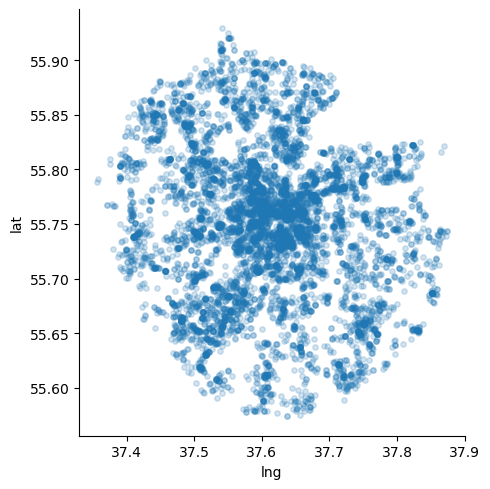

In [27]:
display(pd.DataFrame(data['district'].unique())
        .style.set_caption('Административные округа Москвы')
       )
display(pd.DataFrame(data['category'].unique())
        .style.set_caption('Категории заведений Москвы')
       )
display(pd.DataFrame(data['rating'].describe())
        .style.set_caption('Рейтинг заведений Москвы')
       )

print('Разброс координат:')
sns.lmplot(x="lng", y="lat", data=data, fit_reg=False,
           scatter_kws={'s': 15, 'alpha': 0.2});

Ошибок в названиях округов, заведений и рейтинге нет. Идем дальше.

### Добавление новых столбцов
    - Создайте столбец street с названиями улиц из столбца с адресом.
    - Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
        - логическое значение True — если заведение работает ежедневно и круглосуточно;
        - логическое значение False — в противоположном случае.

In [28]:
data[data['hours'].isnull()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,ижора,булочная,"москва, ижорский проезд, 5а",Северный административный округ,NaN,55.89,37.51,4.40,NaN,NaN,NaN,NaN,0,<NA>
40,кафе,кафе,"москва, ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.90,37.52,3.70,NaN,NaN,NaN,NaN,1,<NA>
44,кафетерий,кафе,"москва, ангарская улица, 24а",Северный административный округ,NaN,55.88,37.52,3.80,NaN,NaN,NaN,NaN,1,8
56,рыба из тандыра,быстрое питание,"москва, коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.89,37.52,1.50,NaN,NaN,NaN,NaN,0,<NA>
108,кафе,"бар,паб","москва, мкад, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.91,37.56,4.20,NaN,NaN,NaN,NaN,1,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"москва, нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.69,37.67,3.40,NaN,NaN,NaN,NaN,0,<NA>
8375,улица гурьянова 55,кафе,"москва, улица гурьянова, 55",Юго-Восточный административный округ,NaN,55.68,37.72,4.50,NaN,NaN,NaN,NaN,0,<NA>
8378,восточно-грузинская кухня,быстрое питание,"москва, зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.71,37.77,4.30,NaN,NaN,NaN,NaN,0,120
8381,аэлита,кафе,"москва, ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.71,37.80,3.80,NaN,NaN,NaN,NaN,0,30


In [29]:
# напишем функцию для выделения улицы из адреса
def take_street(address):
    address = address.strip().lower()
    address = re.sub(r'\s*,\s*', ',', address)
    address = re.split(',|\.', address)
    return address[1]

In [30]:
# напишем функцию для получения столбца с белевыми выражениями, является ли заведение круглосуточным
def is_24_7(time):
    if time != time:
        return np.nan
    elif time == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [31]:
# добавим новые столбцы к таблице с названием улицы и данными о круглосуточной работе
data['street'] = data['address'].apply(take_street)
data['is_24_7'] = data['hours'].apply(is_24_7)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,<NA>,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,<NA>,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148,правобережная улица,False


**Вывод**

- все столбцы с текстовыми данными были переведены в нижний регистр
- явных дубликатов найдено не было
- было найдено и удалено 4 неявных дубликата
- была произведена замена значений по столбцу `chain` на 1 для всех уникальных заведений, встречающихся более 1 раза в данных  
- пропуски составляют значительную часть в данных, поэтому пока нет возможности их удалить, возможно позже мы сможем их обработать
- были добавлены столбцы с названиями улиц и с маркером работы 24/7

## Анализ данных

Будем отвечать на вопросы по порядку.

### Распределение заведений по категориям

• Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [32]:
resto_category = pd.DataFrame(data.groupby(['category']).name.count()
             .reset_index()
             .sort_values(by='name',ascending=False)
             .reset_index(drop=True))
display(resto_category)

,category,name
0,кафе,2376
1,ресторан,1971
2,кофейня,1412
3,"бар,паб",763
4,быстрое питание,675
5,пиццерия,633
6,столовая,315
7,булочная,257


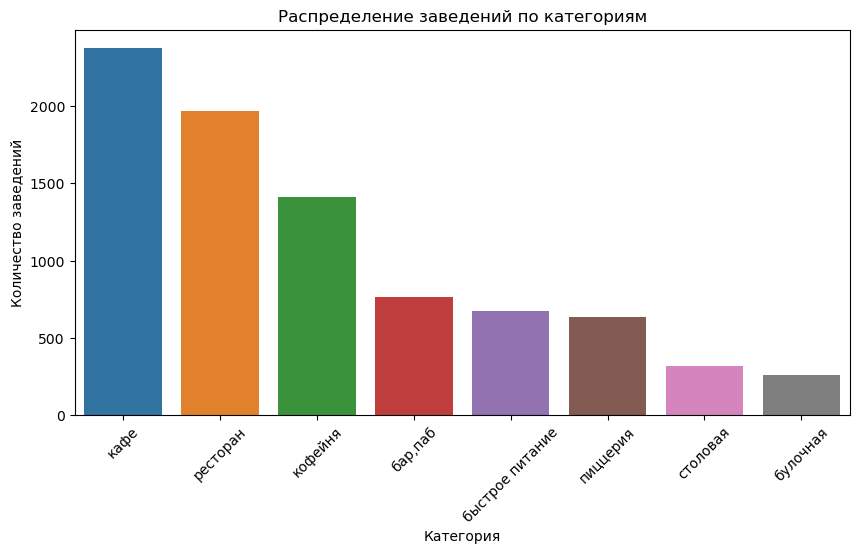

In [33]:
category = pd.DataFrame(data.groupby('category')['name'].count().reset_index().sort_values(by='name',ascending=False)).reset_index(drop=True)
# назначаем размер графика
plt.figure(figsize=(10, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='category',y='name', data=category);
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
plt.show()

Наиболее часто встречающимися заведениями в Москве являются кафе и рестораны. Средними по популярности являются бары и пабы, пиццерии и рестораны быстрого питания. Наименнее часто встречающимися стали столовые и булочные. Рассмотрим распределение по долям:

    - кафе      2376 (28,3%)
    - ресторан  1971 (23,5%)
    - кофейня	1412 (16,8%)
    - бар,паб	763 (9,08 %)
    - быстрое питание	675 (8,03%%)
    - пиццерия	633 (7,53%)
    - столовая	315 (3,75%)
    - булочная	257 (3,06%)

### Количество посадочных мест по категориям

• Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [34]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,<NA>,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,<NA>,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148,правобережная улица,False


In [35]:
# найдем среднее количество мест по категориям
seats_category = pd.DataFrame(data.groupby(['category']).seats.mean()
             .reset_index()
             .sort_values(by='seats',ascending=False)
             .reset_index(drop=True))
display(seats_category)


,category,seats
0,"бар,паб",124.66
1,ресторан,121.91
2,кофейня,111.20
3,быстрое питание,100.72
4,столовая,99.75
5,кафе,97.37
6,пиццерия,94.50
7,булочная,89.39


Больше всего в среднем мест в барах и пабах, меньше всего в булочных.

In [36]:
grouped = data.groupby('category')['seats'].median().sort_values()
plt.figure(figsize=(11, 7))
sns.boxplot(x=data.category, y=data.seats, order=grouped.index);

Уровень нормальных значений по всем категориям заканчивается в районе 300 посадочных мест в заведении. Посмотрим на описательную статистику.

In [37]:
data['seats'].describe()

count   4792.00
mean     108.36
std      122.84
min        0.00
25%       40.00
50%       75.00
75%      140.00
max     1288.00
Name: seats, dtype: Float64

У 75% заведений число посадочных мест не превышает 140, медианное число - 75 мест на заведение. 

Максимальное количество мест - 1288, выглядит весьма нереалистично. 

Посмотрим сколько данных попадает за пределы отметки в 300 посадочных мест.

In [38]:
data.query('seats>300', engine='python')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
127,арарат,кафе,"москва, дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.91,37.54,4.20,NaN,NaN,NaN,NaN,1,350,дмитровское шоссе,False
171,one price coffee,кофейня,"москва, дмитровское шоссе, 163а, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.91,37.54,4.00,NaN,NaN,NaN,NaN,1,350,дмитровское шоссе,False
176,вуди пицца,пиццерия,"москва, дмитровское шоссе, 107а, корп. 1",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.88,37.54,4.00,средние,средний счёт:400–600 ₽,500.00,NaN,0,350,дмитровское шоссе,False
194,ленкорань,кафе,"москва, дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.91,37.54,1.40,NaN,NaN,NaN,NaN,0,350,дмитровское шоссе,False
216,грузинский бульвар,быстрое питание,"москва, дмитровское шоссе, 163а, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.91,37.54,4.00,NaN,NaN,NaN,NaN,0,350,дмитровское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8171,монстер хиллс,ресторан,"москва, автозаводская улица, 18",Южный административный округ,"ежедневно, 10:00–22:00",55.71,37.64,4.00,средние,средний счёт:600–1200 ₽,900.00,NaN,0,455,автозаводская улица,False
8198,милти,быстрое питание,"москва, улица ленинская слобода, 19",Южный административный округ,пн-пт 09:00–19:00,55.71,37.65,3.80,NaN,NaN,NaN,NaN,0,450,улица ленинская слобода,False
8237,pasta cup & pinsa,пиццерия,"москва, автозаводская улица, 18",Южный административный округ,"ежедневно, 10:00–22:00",55.70,37.64,3.50,средние,средний счёт:450–700 ₽,575.00,NaN,0,455,автозаводская улица,False
8315,чайхана бишкек,ресторан,"москва, тихорецкий бульвар, 2, корп. 1",Юго-Восточный административный округ,"ежедневно, 09:00–01:30",55.68,37.78,4.10,NaN,NaN,NaN,NaN,0,305,тихорецкий бульвар,False


Нашлась 251 строка с заведениями, где посадочных мест больше 300. Это 5% данных от 4792 строк, считаю, что для корректности дальнейшего анализа следует удалить эти выбросы. Также после проведения анализа по этим заведениям в интернете, я пришла к выводу, что наши данные не совпадают с действительностью, у многих заведений из этого списка вообще нет посадочных мест или их очень мало. А цифры по колонке `seats` у этих заведений часто повторяются цифра в цифру, что наталкивает на мысль о неправильно заполненных данных.

In [39]:
# фильтруем данные
seats = data.query('seats<300', engine='python')

In [40]:
#смотрим как изменилась описательная статистика
seats['seats'].describe()

count   4479.00
mean      84.76
std       66.12
min        0.00
25%       40.00
50%       70.00
75%      118.00
max      295.00
Name: seats, dtype: Float64

In [41]:
grouped = seats.groupby('category')['seats'].median().sort_values()
plt.figure(figsize=(11, 7))
sns.boxplot(x=seats.category, y=seats.seats, order=grouped.index);

In [42]:
# получим среднее количество посадочных мест в заведения по категриям на фильтрованных данных
seats_filtred = pd.DataFrame(seats.groupby(['category']).seats.mean()
             .reset_index()
             .sort_values(by='seats',ascending=False)
             .reset_index(drop=True))
display(seats_filtred)

,category,seats
0,ресторан,97.12
1,"бар,паб",88.94
2,кофейня,85.74
3,быстрое питание,81.25
4,столовая,78.55
5,пиццерия,76.84
6,булочная,76.66
7,кафе,76.06


После фильтрации данных от выбросов, позиции у категорий немного изменились. Теперь в среднем больше всего посадочных мест в ресторанах, а меньше всего в кафе.

Посмотрим как распределены заведения по посадочным местам внутри категорий. Выделим следующие категории в заведениях по количеству мест:

- 0 - заведения без посадочных мест
- 0-20 - заведения маленького размера
- 20-80 - заведения среднего размера
- 80-120 - заведения большего размера
- 120+ - очень большие заведения

In [43]:
# напишем функцию для категоризации категорий заверений по количеству мест
def categorization_seats(seats):
    if (seats != seats):
        return np.nan
    seats = int(seats)
    if (seats == 0):
        return '0'
    elif (seats <= 20):
        return '1 - 20'
    elif (seats <= 80):
        return '21 - 80'
    elif (seats <= 120):
        return '81 - 120'
    else:
        return '121 +'

In [44]:
# добавим категории к данным
seats['seats_category'] = seats['seats'].apply(categorization_seats)

In [45]:
data_seats = (
    seats.groupby(['category', 'seats_category'], as_index=False)
    .agg(count=('name', 'count')).sort_values('count', ascending=False)
)

# Построим столбчатую диаграмму
fig = one_plot_creator(
    df=data_seats,
    x='category', y='count', color='seats_category', text='count',
    title='Распределение количества мест в заведениях по категориям',
    xaxis_title='Категория', yaxis_title='количество заведений',
    legend_title='Кол-во мест', barmode='group',height=600
)
fig.show()

Во всех категориях лидируют по количеству заведения с количеством мест от 21 до 80. Второе и третье места делят заведения большого размера(81-120) и заведения очень большого размера(121+). Меньше всего во всех категориях заведений без посадочных мест.

### Соотношение сетевых и несетевых заведений

•	Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [46]:
chains = pd.DataFrame(data.groupby('chain').name.count()).reset_index() 
chains

,chain,name
0,0,4701
1,1,3701


In [47]:
# построим круговую диаграмму
labels=['несетевое','сетевое']
chains.plot(y='name', kind='pie',labels=labels, 
               autopct='%1.1f%%', fontsize=11, figsize=(6,6), 
               legend=False, title='Распределение заведений на сетевые и несетевые', startangle=10);
plt.ylabel("");

Больше всего в Москве не сетевых заведений - 4701, сетевых же - 3701.

•	Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [48]:
data_chains = data.groupby(by=['category', 'chain'], as_index=False).agg(
    count=('name', 'count')).sort_values(by=['count'], ascending=False)

data_chains.loc[data_chains['chain'] == 0, 'chain'] = 'несетевое'
data_chains.loc[data_chains['chain'] == 1, 'chain'] = 'сетевое'

for i in range(len(data_chains)):
    tv = (data_chains.loc[i]['count']/len(data[data['category'] == data_chains.loc[i]['category']]))*100
    data_chains.at[i, 'ratio'] = str(round(tv, 2)) + '%'
    
fig = one_plot_creator(
    df=data_chains,
    x='category', y='count', color='chain', text='ratio',
    title='Соотношение сетевых и несетевых заведений по категориям',
    xaxis_title='категория', yaxis_title='количество заведений',
    legend_title='Принадлежность к сети',height=600
)
#сортировка по сумме в столбце в обратном порядке
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Сетевые заведения превалируют в булочных, быстром питании, кофейнях и пиццериях. Наибольшее число сетевых заведений в абсолютном выражении в категории кафе, рестораны и кофейни.

### Топ-15 популярных сетей в Москве

•	Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [49]:
data.query('chain == 1').groupby('name').chain.count().sort_values(ascending=False).head(15)

name
кафе                                   188
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            72
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
Name: chain, dtype: int64

Мы видим, что в список попали заведения, означающие категорию заведения, а не название сети, к ним относится: `кафе, 
хинкальная, шаурма, чайхана, ресторан, столовая`. Считаю, что их нужно удалить, чтобы они не исказили исследование.

In [50]:
top_15 = pd.DataFrame(data.query('chain == 1').groupby('name').chain.count().sort_values(ascending=False)).reset_index()
drop_list = ['кафе','хинкальная', 'шаурма', 'чайхана', 'ресторан', 'столовая']
top_15 = top_15.query('name not in @drop_list').reset_index(drop=True).head(15)
top_15


,name,chain
0,шоколадница,120
1,домино'с пицца,77
2,додо пицца,74
3,one price coffee,72
4,яндекс лавка,72
5,cofix,65
6,prime,50
7,кофепорт,42
8,кулинарная лавка братьев караваевых,39
9,теремок,38


Самым популярным заведением является Шоколадница, аж 120 филиалов! И не удивительно, ведь это кафе встречается почти на каждой станции метро. 

Дальше с разницей практически в 50 филиатов идут Домино'с пицца - 77 , Додо пицца - 74, One price coffe - 72, Яндекс лавка - 72.

Наименьшее число филиалов у Кофемании - 23.

Все эти заведения расчитаны на быстрое удовлетворение потребности человека в еде и кофе, имеют демократичную ценовую политику, ориентируются на то, чтобы быть как можно ближе к пути следования возможного потребителя. Из всех сетей, представленных в Москве мне лично знакомы Додо пицца и One price coffe, т.к. они есть и в нашем городе.

In [51]:
top_15_name = top_15['name'].to_list()

In [52]:
top_15_df = data.query('name in @top_15_name')

In [53]:
fig = scatter_mapbox_creator(df=top_15_df, lat='lat', lon='lng', color='name', zoom=9, hover_name='name')
fig.show()

In [54]:
fig = one_plot_creator(
    df=top_15_df.groupby(['name', 'category'], as_index=False).agg(count=('category', 'count')).query('count>8').sort_values(by=['count','category'], ascending=False),
    x='name', y='count', color='category', text='count',
    title='Самые популярные категории в сетевых заведениях топ-15',
    xaxis_title='Название сети', yaxis_title='Количество заведений',
    legend_title='Категория', height=450
)
fig.show()

Самая встречаемая категория среди сетевых заведений из топ-15 - кофейня, 6 сетевых заведений, наименее часто встречающаяся категория - булочная, 1 заведение.

### Анализ заведений в разрезе административных районов

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [55]:
# выведем общий список административных огругов, присутствующих в датасете
display(pd.DataFrame(data['district'].unique())
        .style.set_caption('Административные округа Москвы')
        .hide_index()
       )

0
Северный административный округ
Северо-Восточный административный округ
Северо-Западный административный округ
Западный административный округ
Центральный административный округ
Восточный административный округ
Юго-Восточный административный округ
Южный административный округ
Юго-Западный административный округ


Посмотрим на распределение заведений в общем по районам Москвы.

In [56]:
districts = pd.DataFrame(data.groupby('district').name.count().sort_values(ascending=False)).reset_index()

In [57]:
fig = one_plot_creator(
    df=districts,
    x='district', y='name',  color=None, text='name',
    title='Распределение заведений по районам Москвы',
    xaxis_title='Район', yaxis_title='Количество заведений',
    legend_title=None, height=450
)
fig.show()

Наибольшее количество заведений сосредоточено в Центральном административном округе - 2242 заведения. Во всех остальных районах, кроме Северо-Западного административного округа, распределение практически одинаковое - 709-898 заведений (8,4-10,7%). В Северо-Западном административном округе, находится всего 409 заведений (4,9%).

Посмотрим на распределение заведений по категориям по районам Москвы.

In [58]:
district_count = (
    data.groupby(['district', 'category'], as_index=False)
    .agg(count=('name', 'count')).sort_values('count', ascending=False)
)


In [59]:
# Построим столбчатую диаграмму
fig = one_plot_creator(
    df=district_count,
    x='district', y='count', color='category', 
    title='Распределение категорий заведений по административным районам',
    xaxis_title='район', yaxis_title='количество заведений',
    legend_title='Категория заведения', barmode='group',height=600
)
fig.show()

Распределение заведений по категориям сильно отличается в центральном административном округе от остальных округов.

На первом месте рестораны, далее по убыванию кафе,кофейни, быры и пабы, пиццерии, быстрое питание, столовые, булочные.

В других округах лидирующую позицию занимают кафе, далее второе место зачастую с большим отстованием занимают рестораны, после по убыванию кофейни, пиццерии и быстрое питание, быры и пабы, столовые и булочные.

### Визуализация среднийх рейтинов по категориям заведений.

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [60]:
rating_by_resto = data.groupby('category').rating.mean().sort_values(ascending=False)

In [61]:
rating_by_resto.plot(kind='bar',figsize=(7,5));
plt.xlabel('Категория заведения');
plt.ylabel('Средний рейтинг', );
plt.title('Средний рейтинг по заведениям в разрезе категорий');
plt.ylim(3.9,4.5);

В среднем бары и пабы имеют наилучший рейтинг среди заведений общепита в Москве, следом с отстованием в 0,08  и в 0,09 идут рестораны и пиццерии. Наихудший рейтинг в среднем имеют заведения, категории "Быстрое питание" - 4,03. При этом абсолютная разница в среднем рейтинге не такая большая, всего 0,36 между наибольшим и наименьшим средним рейтингом среди категорий. Можно посмотреть как средний рейтинг меняется в зависимости от района Москвы.

In [62]:
# составим сводную таблицу для получения среднего рейтинга по категориям заведений в разрезе районов
rating = (
    data.groupby(['category', 'district'], as_index=False)
    .agg(count=('rating', 'mean')).sort_values('count', ascending=False)
)

In [63]:
rating

,category,district,count
5,"бар,паб",Центральный административный округ,4.49
59,ресторан,Центральный административный округ,4.42
50,пиццерия,Центральный административный округ,4.41
1,"бар,паб",Западный административный округ,4.40
4,"бар,паб",Северо-Западный административный округ,4.39
...,...,...,...
18,быстрое питание,Восточный административный округ,4.01
20,быстрое питание,Северный административный округ,3.99
22,быстрое питание,Северо-Западный административный округ,3.96
19,быстрое питание,Западный административный округ,3.93


In [64]:
fig = one_plot_creator(
    df=rating,
    x='district', y='count', color='category', 
    title='Средний рейтинг кафе по категориям',
    xaxis_title='Район', yaxis_title='Средний рейтинг',
    legend_title='Категория кафе', barmode='group'
)
fig.update_layout(
    yaxis_range=[3.9, 4.5],
    height=450
)
fig.show()

Наилучшие средние рейтинги по категориям у заведений из ЦАО, наихудшие средние рейтинги в ЮВАО.

### Картограмма со средним рейтингом заведений по районам

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson

In [65]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating',ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [67]:
# загружаем JSON-файл с границами округов Москвы
state_geo = './admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_rating)

# выводим карту
m_rating

Наибольший средний рейтинг по заведениям имеет Центральный административный округ, наименьшей - Юго-Восточный административный округ.

### Все заведения датасета на карте

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [68]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_resto = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_resto)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m_resto

### Топ-15 улиц по количеству заведений

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [69]:
top_15_streets = data.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name',ascending=False).head(15)
top_15_streets_name = top_15_streets['street'].to_list()
top_15_st_df = data.query('street in @top_15_streets_name').groupby(['street', 'category'], as_index=False).agg(
    count=('name', 'count')).sort_values(by=['count','street'], ascending=False)

In [70]:
top_15_st_df

,street,category,count
79,проспект мира,кафе,53
82,проспект мира,ресторан,45
64,мкад,кафе,45
80,проспект мира,кофейня,36
87,профсоюзная улица,кафе,35
...,...,...,...
62,мкад,"бар,паб",1
67,мкад,столовая,1
59,люблинская улица,пиццерия,1
24,кутузовский проспект,булочная,1


In [71]:
fig = one_plot_creator(
    df=top_15_st_df,
    x='count', y='street', color='category', text='count',
    title='Распределение количества заведений и их категорий по улицам из топ-15',
    xaxis_title='Количество заведений', yaxis_title='Улица',
    legend_title='Категория заведения'
)
#сортировка по сумме в столбце в обратном порядке
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total descending'})
fig.show()

Самое большое количество заведений располагается на проспекте Мира - 183. 

Далее по числу заведений идут:
- Профсоюзная улица - 122
- проспект Вернадского - 108
- Ленинский проспект - 107
- Ленинградский проспект -	95

Большое количество заведений на этих улицах обусловлено их значительной длиной.

Наименьшее количество заведений из топ-15 улиц на улице Пятницкого.

Наиболее популярны на этих улицах кафе, рестораны и кофейни. Наименьшая популярность у столовых и булочных.

###  Улицы с 1 объектом общепита

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [72]:
# найдем названия улиц, где есть только одно заведение общепита
street_1_resto = (data
                  .groupby('street', as_index=False)['name']
                  .agg('count')
                  .sort_values(by='name')
                  .query('name ==1')['street'].to_list()
                 )

In [73]:
# найдем как распределены по категриям заведения, которые одни на всю улицу
resto_1_df = data.query('street in @street_1_resto').groupby(
    'category', as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False).reset_index(drop=True)
resto_1_df

,category,count
0,кафе,158
1,ресторан,87
2,кофейня,83
3,"бар,паб",39
4,столовая,36
5,быстрое питание,29
6,пиццерия,15
7,булочная,8


In [74]:
#построим столбчатую диаграмму
fig = one_plot_creator(
    df=resto_1_df,
    x='category', y='count',  color=None,  text='count',
    title='Распределение одиночных заведений по категориям',
    xaxis_title='Категория', yaxis_title='Количество заведений',
    legend_title=None, height=450
)
fig.show()

В данных есть 158 кафе, которые стоят в одиночестве улицу. Найдено также 87 и 83 ресторана и кофейни соответственно, стоящих одиноко. Реже, встречаются быры, столовые и быстрое питание. 

Крайне редко встречаются пиццерии и булочные. Полагаю, что для этих заведений нужна хорошая проходимость, и они выбирают для себя более оживленные места.

### Исследование среднего чека по заведениям

•	Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [75]:
bill_df = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill',ascending=False)
bill_df

,district,middle_avg_bill
1,Западный административный округ,1000.00
5,Центральный административный округ,1000.00
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [76]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.5,
    legend_name='Медианный счет заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий медианный средний чек, в Центральном административном округе и Западном административном округе -  1000 рублей. Наименьший медианный средний чек в Северо-Восточном административном округе, Южном административном округе и Юго-Восточном административном округе - 450-500 рублей. Другие районы находятся в диапазоне - 575-700 рбулей.

В целом удаление от центра дальше чем за ЦАО не сильно влияет на средний чек. Больше оказывает влияние престижность и сообвественно дороговизна района. Чем престижнее район, тем выше средний чек и наооборот. 

### Вывод

- Наиболее часто встречающимися заведениями в Москве являются кафе,рестораны и кофейни. Средними по популярности являются бары и пабы, пиццерии и рестораны быстрого питания. Наименнее часто встречающимися стали столовые и булочные.
- В среднем больше всего посадочных мест в ресторанах, а меньше всего в кафе.
- Во всех категориях лидируют по количеству заведения с количеством мест от 21 до 80. Второе и третье места делят заведения большого размера(81-120) и заведения очень большого размера(121+). Меньше всего во всех категориях заведений без посадочных мест.
- Больше всего в Москве не сетевых заведений - 4701, сетевых же - 3701.
- Сетевые заведения превалируют в булочных, быстром питании, кофейнях и пиццериях. Наибольшее число сетевых заведений в абсолютном выражении в категории кафе, рестораны и кофейни.
- Самая встречаемая категория среди сетевых заведений из топ-15 - кофейня, 6 сетевых заведений, наименее часто встречающаяся категория - булочная, 1 заведение.
- Все сетевые заведения из топ-15 расчитаны на быстрое удовлетворение потребности человека в еде и кофе, имеют демократичную ценовую политику, ориентируются на то, чтобы быть как можно ближе к пути следования возможного потребителя.
- Наибольшее количество заведений сосредоточено в Центральном административном округе - 2242 заведения. Во всех остальных районах, кроме Северо-Западного административного округа, распределение практически одинаковое - 709-898 заведений (8,4-10,7%). В Северо-Западном административном округе, находится всего 409 заведений (4,9%).
- В ЦАО больше всего распространены рестораны, а в остальных округах - кафе, менее всего во всех округах - булочные и столовые.
- В среднем бары и пабы имеют наилучший рейтинг среди заведений общепита в Москве, наихудший имеют заведения быстрого питания.
- Наилучшие средние рейтинги по категориям у заведений из ЦАО, наихудшие средние рейтинги в ЮВАО.
- Самое большое количество заведений располагаются на проспекте Мира, Профсоюзной улица, проспекте Вернадского, Ленинском проспекте, Ленинградском проспекте. Большое количество заведений на этих улицах обусловлено их значительной длиной. Наименьшее количество заведений из топ-15 улиц на улице Пятницкого. Наиболее популярны на этих улицах кафе, рестораны и кофейни. Наименьшая популярность у столовых и булочных.
- В данных есть 158 кафе, которые стоят в одиночестве улицу. Найдено также 87 и 83 ресторана и кофейни соответственно, стоящих одиноко. Реже, встречаются быры, столовые и быстрое питание. Крайне редко встречаются пиццерии и булочные. Полагаю, что для этих заведений нужна хорошая проходимость, и они выбирают для себя более оживленные места.
- Самый высокий медианный средний чек в Центральном административном округе и Западном административном округе. Наименьший медианный средний чек в Северо-Восточном административном округе, Южном административном округе и Юго-Восточном административном округе.

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

### Сколько всего кофеен и как они распределены по районам

In [77]:
# получим сколько всего кофеен в данных
data.query('category == "кофейня"').name.count()

1412

Как мы видим, кофеен действительно много в Москве, 1412! Они стоят по популярности на третьем месте после кафе и ресторанов. Постомрим как кофейни разделены между районами.

In [78]:
coffee = data.query('category == "кофейня"')
coffee_by_district = pd.DataFrame(data.query('category == "кофейня"').groupby(['district']).name.count()
             .reset_index()
             .sort_values(by='name',ascending=False)
             .reset_index(drop=True))
coffee_by_district.columns = ['округ','кол-во кофеен']
coffee_by_district

,округ,кол-во кофеен
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,130
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [79]:
#построим столбчатую диаграмму
fig = one_plot_creator(
    df=coffee_by_district,
    x='округ', y='кол-во кофеен',  color=None,  text='кол-во кофеен',
    title='Распределение количества кофеен по районам',
    xaxis_title='Район', yaxis_title='Количество кофеен',
    legend_title=None, height=450
)
fig.show()

428 (30,3%) всех кофеен сосредоточены в ЦАО, меньше всего в СЗАО - 62 (4,39).

In [80]:
coffee_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_by_district,
    columns=['округ', 'кол-во кофеен'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Распределение кофеен по районам',
).add_to(coffee_m)

# выводим карту
coffee_m

Больше всего кофеен в ЦАО - 428, но там больше всего и проходимость. Меньше всего в СЗАО всего 62 кофейни.

Добавим к делению кофеен по районам точки с кофейнями на карте.

In [81]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee_m) 

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
coffee_m

Оценим сколько филиалов у топ-15 сетевых кофеен в Москве.

In [82]:
# посмотрим на топ 15 сетевых кофеен
coffee_chain = coffee.groupby('name').name.count().sort_values(ascending=False).head(15)

print('Количество филиалов сетевых кофеен всего:',coffee.query('chain==1').name.count())
print('Количество филиалов у сетевых кофеен из топ-15:')
coffee_chain

Количество филиалов сетевых кофеен всего: 753
Количество филиалов у сетевых кофеен из топ-15:


name
шоколадница         119
one price coffee     72
cofix                65
кофепорт             42
cofefest             31
кофемания            22
cinnabon             20
правда кофе          13
krispy kreme          9
кофейня               9
coffeekaldi's         8
даблби                8
wild bean cafe        8
udcкафе               8
9 bar coffee          7
Name: name, dtype: int64

In [83]:
coffee_chain.plot(kind='bar',figsize=(7,5));
plt.xlabel('Название сети');
plt.ylabel('Колиечство заведений в сети', );
plt.title('Топ-15 сетевых кофеен');
plt.ylim();

С большим отрывом лидирует среди кофеен "Шоколадница" - 119 заведений, затем "One price coffee" - 72 заведения и cofix - 65 заведений. Меньше всего филиалов у сети "9 bar coffe" - 7.

In [84]:
# Посмотрим на каких улицах располагается больше всего кофеен и сколько из них сетевые
coffee_top_15 = coffee.groupby('street',as_index=False)['name'].agg('count').sort_values(by='name',ascending=False).head(15) 
coffee_15_streets_name =   coffee_top_15['street'].to_list() 
coffee_top_15_chain = coffee.query('street in @coffee_15_streets_name').groupby(by=['street', 'chain'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)

coffee_top_15_chain.loc[coffee_top_15_chain['chain'] == 0, 'chain'] = 'несетевое'
coffee_top_15_chain.loc[coffee_top_15_chain['chain'] == 1, 'chain'] = 'сетевое'

In [85]:
for i in range(len(coffee_top_15_chain)):
    tv = (coffee_top_15_chain.loc[i]['count']/len(coffee[coffee['street'] == coffee_top_15_chain.loc[i]['street']]))*100
    coffee_top_15_chain.at[i, 'ratio'] = str(round(tv, 2)) + '%'

coffee_top_15_chain=coffee_top_15_chain.sort_values('count', ascending=False)
    
fig = one_plot_creator(
    df=coffee_top_15_chain,
    x='street', y='count', color='chain', text='ratio',
    title='Соотношение сетевых и несетевых кофеен по улицам из топ-15',
    xaxis_title='категория', yaxis_title='количество заведений',
    legend_title='Принадлежность к сети',height=600
)
#сортировка по сумме в столбце в обратном порядке
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})

fig.show()

Из диаграммы видно, что больше всего кофеен располагается на проспекте мира, причем 22 из них относятся к сетевым кофейням. В принципе сетевые кофейни преобладают на всех улицах из топ-15. Только на Ленинском, Волгоградском проспекте и Новодмитровской улице больше несетевых кофеен.

### Круглосуточные кофейни

In [86]:
# посчитаем сколько кофеен работает круглосуточно
coffee.query('is_24_7 == True').name.count()
print('Процент кофеен работающих круглосуточно: ',round(59/1412*100),'%')

Процент кофеен работающих круглосуточно:  4 %


In [87]:
coffe_day_n_nigth = coffee.query('is_24_7 == True')

In [88]:
fig = scatter_mapbox_creator(df=coffe_day_n_nigth, lat='lat', lon='lng', color='name', zoom=9, hover_name='name')
fig.show()

In [89]:
coffe_24_7_df = (coffe_day_n_nigth.groupby('district').name.count().reset_index()
             .sort_values(by='name',ascending=False)
             .reset_index(drop=True))
coffe_24_7_df

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [90]:
coffee_24_7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffe_24_7_df,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Распределение круглосуточных кофеен по районам',
).add_to(coffee_24_7)

# выводим карту
coffee_24_7

Преимущественно круглосуточные кофейни расположены в ЦАО - 26 заведений. Меньше всего в ЮАО и ЮВАО - всего по 1 штуке на округ.


In [91]:
# посмотрим сколько из круглосуточных кофеен относится к сетевым
coffe_day_n_nigth.groupby('chain').name.count()
coffee_chain_24_7 = coffe_day_n_nigth.groupby(['district', 'chain'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)

In [92]:
coffee_chain_24_7.loc[coffee_chain_24_7['chain'] == 0, 'chain'] = 'несетевое'
coffee_chain_24_7.loc[coffee_chain_24_7['chain'] == 1, 'chain'] = 'сетевое'

for i in range(len(coffee_chain_24_7)):
    tv = (coffee_chain_24_7.loc[i]['count']/len(coffe_day_n_nigth[coffe_day_n_nigth['district'] == coffee_chain_24_7.loc[i]['district']]))*100
    coffee_chain_24_7.at[i, 'ratio'] = str(round(tv, 2)) + '%'
    
fig = one_plot_creator(
    df=coffee_chain_24_7,
    x='district', y='count', color='chain', text='ratio',
    title='Соотношение сетевых и несетевых кофеен по улицам из топ-15',
    xaxis_title='категория', yaxis_title='количество заведений',
    legend_title='Принадлежность к сети',height=600
)
#сортировка по сумме в столбце в обратном порядке
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})

fig.show()

Как мы видим из диаграмы, преимущественно все круглосуточные кофейни - сетевые. Больше всего их в ЦАО, но также присутствуют и несетевые. Еще несетевые круглосуточные кофейни встречаются ЗАО 1 заведение и ЮЗАО 2 заведения.

### Рейтинги кофеен по районам

Какие у кофеен рейтинги? Как они распределяются по районам?

In [93]:
rating_by_coffee = coffee.groupby('district').rating.mean().sort_values()

In [94]:
rating_by_coffee

district
Западный административный округ           4.20
Северо-Восточный административный округ   4.22
Юго-Восточный административный округ      4.23
Южный административный округ              4.23
Восточный административный округ          4.28
Юго-Западный административный округ       4.28
Северный административный округ           4.29
Северо-Западный административный округ    4.33
Центральный административный округ        4.34
Name: rating, dtype: float64

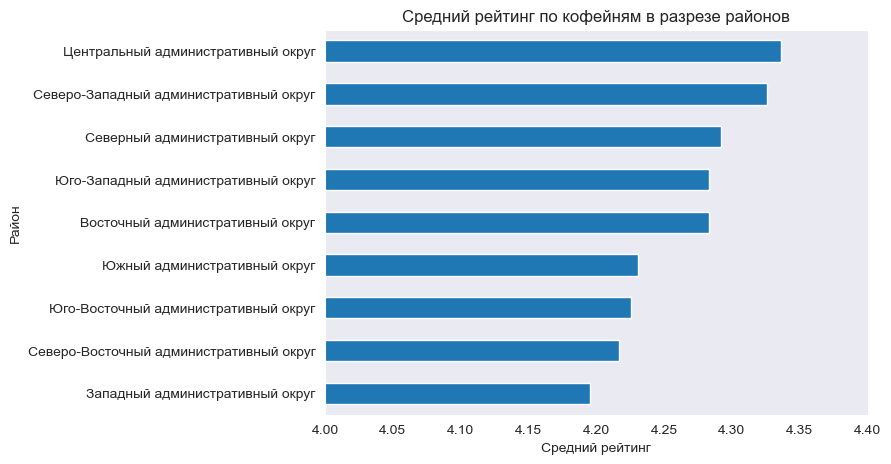

In [107]:
rating_by_coffee.plot(kind='barh',figsize=(7,5));
plt.xlabel('Средний рейтинг');
plt.ylabel('Район');
plt.title('Средний рейтинг по кофейням в разрезе районов');

plt.xlim(4.0,4.4);
plt.show()

В среднем рейтинг у кофеен в ЦАО и СЗАО выше чем во всех остальных районах - 4,34 и 4,33 соответственно. Наименьший средний рейтинг у кофеен в ЗАО - 4,20.

### Стоимость чашки капучино

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [96]:
# посмотрим как распределены цены на чашку капучино по кофейням
coffee['middle_coffee_cup'].describe()

count    521.00
mean     175.06
std       89.75
min       60.00
25%      124.00
50%      170.00
75%      225.00
max     1568.00
Name: middle_coffee_cup, dtype: float64

In [97]:
 # назначаем размер графика
plt.figure(figsize=(5, 5))

coffee.boxplot('middle_coffee_cup');

Как мы видим есть один выброс на уровне 1600 рублей за чашку капучино, в остальном нормальные значения цены чашки капучино заканчивается на уровне 400 рублей за порцию. Предлагаю убрать выброс, чтобы он не искажал показатели.

In [98]:
coffee_cup = coffee.query('middle_coffee_cup<400')

In [99]:
bill_by_coffee = coffee_cup.groupby('district').middle_coffee_cup.mean().sort_values()
bill_by_coffee

district
Восточный административный округ          140.02
Юго-Восточный административный округ      151.09
Южный административный округ              158.49
Северо-Восточный административный округ   165.33
Северо-Западный административный округ    165.52
Северный административный округ           165.79
Юго-Западный административный округ       184.18
Центральный административный округ        187.52
Западный административный округ           189.94
Name: middle_coffee_cup, dtype: float64

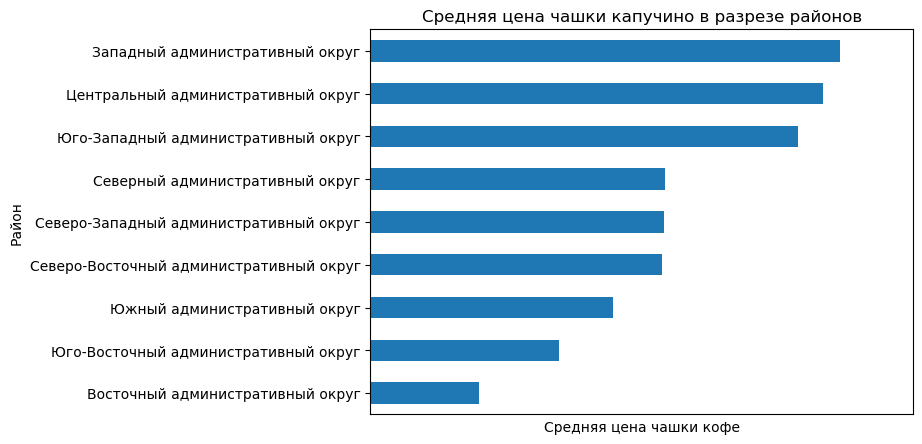

In [100]:
bill_by_coffee.plot(kind='barh',figsize=(7,5));
plt.xlabel('Средняя цена чашки кофе');
plt.ylabel('Район');
plt.title('Средняя цена чашки капучино в разрезе районов');

plt.xlim(125,200);
plt.show()

Самая высокая средняя цена  чашки кофе неожиданно в ЗАО 190 рублей за чашку капучино, следом идут ЦАО и ЮВАО со средним ценником в 188 и 184 рубля за чашку капучино соответственно. Самая низкая цена на чашку капучино в ВАО - 140 рублей.

In [101]:
# напишем функцию для категоризации категорий заведений по количеству мест
def categorization_coffee_cup(middle_coffee_cup):
    if (middle_coffee_cup != middle_coffee_cup):
        return np.nan
    middle_coffee_cup = int(middle_coffee_cup)
    if (middle_coffee_cup == 0):
        return '0'
    elif (middle_coffee_cup <= 125):
        return '60 - 125'  # категория "цена ниже среднего"
    elif (middle_coffee_cup <= 170):
        return '125 - 170' # категория "средняя цена"
    elif (middle_coffee_cup <= 225): 
        return '170 - 225' # категория "цена выше среднего"
    else:
        return '225 +' # категория "цена значительно выше среднего"

In [102]:
# добавим категории к данным
coffee_cup['coffee_category'] = coffee['middle_coffee_cup'].apply(categorization_coffee_cup)

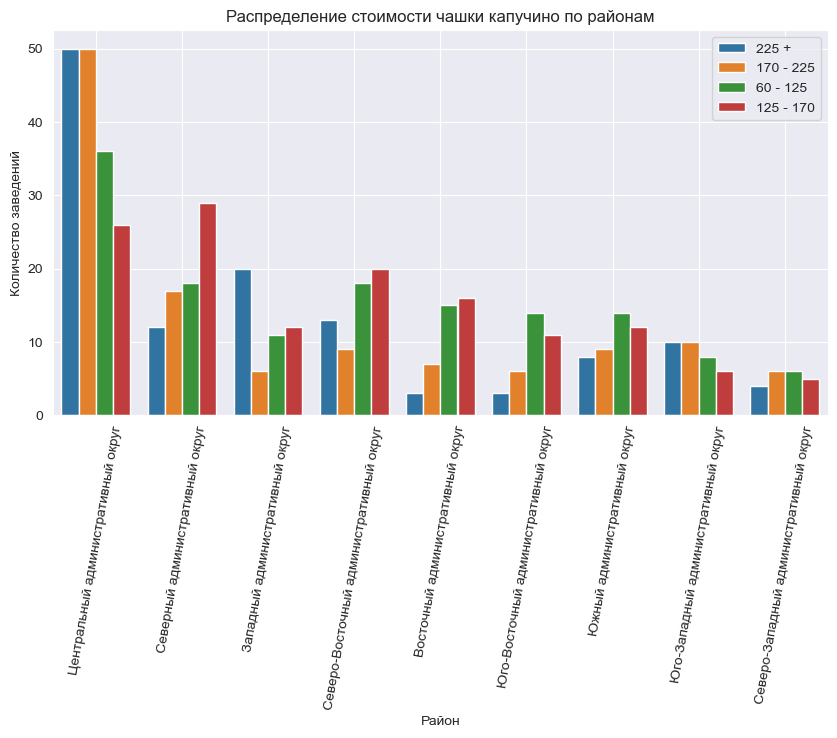

In [103]:
# группируем данные по категориям заведений и категориям цен и считаем количество заведений
data_coffee= coffee_cup.groupby(['district', 'coffee_category'], \
                        as_index = False)[['name']].count().sort_values(by=['name','coffee_category'],ascending=False)
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='district', y='name', data=data_coffee, hue='coffee_category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение стоимости чашки капучино по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=80)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Как мы видим из диаграммы, в ЦАО первенство по цене делят кофейни ценовой катогории "выше среднего" и "значительно выше среднего", далее по популярности идут кофейни с ценой ниже среднего. А со средней ценой заведений меньше всего.

Хотела бы обратить внимание на ЗАО. В нем преобладают кофейни с ценовой категорией значительно выше среднего, а кофеен с категорией "выше среднего" не так много, всего 6. Как мне кажется это наш вариант занять нишу в этом районе. Здесь при открытии заведения, стоит ориентироваться на цену от 190 рублей за чашку капучино.

### Выбор и обоснование точки для кофейни

Как мы уже ранее видели, в ЗАО не очень много кофеен, всего - 150. При этом средний рейтинг у них не очень хороший, ниже чем во всех остальных районах - 4,2. Это говорит нам о том, что людям в этом районе хочется лучшего качества обслуживания и они готовы платить за это деньги, т.к. все-таки преобладают там кофейни ценовой категории "значительно выше среднего". Если мы сможем открыть кофейню с ценовой категорией ниже на одну ступень, при этом дадим хорошее обслуживание, уверена, что к нам потянутся люди.

Давайте посмотри подробнее на карту ЗАО и расположенных там заведений с рейтингом и ценовой категорией

In [104]:
coffee_zao = coffee_cup.query('district == "Западный административный округ"')

In [105]:
zao_lat = 55.73853327193383
zao_lng = 37.46522079788122

coffee_zao_m = Map(location=[zao_lat, zao_lng], zoom_start=11)


# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee_zao_m) 

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['coffee_category']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_zao.apply(create_clusters, axis=1)

# выводим карту
coffee_zao_m

Изучив информацию в интернете с советами по подбору мест для кофейни, я определила, что для нашего формата хорошо подойдет место рядом с парком (хороший дневной трафик за счет мам с детьми, фрилансеров и пенсионеров), метро (хороший утренний и вечерний трафик на кофе с собой для студентов и работников деловых центрови завода). Такми идеальным сочетанием обладает область возле метро "Парк Победы".

Так как ценовая политика у нас будет в категории выше среднего, но при этом ниже на одну ступеть, чем у конкуренов в ближайшем окружении, мы сможем перетянуть на себя часть трафика, при этом не сильно потеряв в выручке. Этот будет, как хотели инвесторы, местом для приятных и доступных посиделок. Конечно, ставку нам стоит сделать на качество обслуживания и приятный интерьер.

Рядом с нами будет располагаться "Шоколадница" и "Кофе&Молоко", а также есть "ВкусВилл", что говорит о хорошей платежеспособности клиента.

Есть два варианта размещения на этой локации, расположиться в том же здании, что и "Шоколадница" по адресу:Площадь Победы, 1к Б, либо въехать в здание напротив по адресу: Площадь Победы, 2 к2,  и перетянуть на себя клиентуру со стороны бизнес-центров и завода, которой не будет хотеться переходить дорогу. Однако есть риск, что мы потеряем тех, что будут идти из парка/в парк. Здесь решение остается за киентом.

Отметим на карте эти две точки.

In [106]:
# координаты дома возле парка победы
point_1_lat = 55.735394
point_1_lng = 37.518798

# координаты дома напротив
point_2_lat = 55.7375796447757
point_2_lng = 37.51889898452249

# создаём карту с центром в точке расположения первой точки и начальным зумом 16
coffee_point = folium.Map(location=[point_1_lat, point_1_lng], zoom_start=16)
# создаём маркер в точке расположения первой точки и сразу добавляем на карту
folium.Marker([point_1_lat, point_1_lng]).add_to(coffee_point)
# создаём маркер в точке расположения второй точки и сразу добавляем на карту
folium.Marker([point_2_lat, point_2_lng]).add_to(coffee_point)

# выводим карту
coffee_point

### Вывод:

- В Москве отрыто 1412 кофеен, из них 30,3% сосредоточены в ЦАО, меньше всего в СЗАО - 4,39%.
- Всего филиалов сетевых кофеен в Москве 753. С большим отрывом среди сетевых кофеен лидирует "Шоколадница" - 119 филиалов, затем "One price coffee" - 72 заведения и cofix - 65 заведений. Меньше всего филиалов у сети "9 bar coffe" - 7.
- Круглосуточно работает только 4 % всех кофеен.Преимущественно круглосуточные кофейни расположены в ЦАО - 26 заведений. Меньше всего в ЮАО и ЮВАО - всего по 1 штуке на округ. Среди круглосуточных кофеен преобладают сетевые. Больше всего их в ЦАО, но также присутствуют и несетевые. Еще несетевые круглосуточные кофейни встречаются ЗАО 1 заведение и ЮЗАО 2 заведения.
- В среднем рейтинг у кофеен в ЦАО и СЗАО выше чем во всех остальных районах - 4,34 и 4,33 соответственно. Наименьший средний рейтинг у кофеен в ЗАО - 4,20.
- Самая высокая средняя цена  чашки кофе в ЗАО 190 рублей за чашку капучино, следом идут ЦАО и ЮВАО со средним ценником в 188 и 184 рубля за чашку капучино соответственно. Самая низкая цена на чашку капучино в ВАО - 140 рублей. 

В качестве места для открытия кофейни мы предлагаем ЗАО. Ранее мы видели, в ЗАО не очень много кофеен, всего - 150. При этом средний рейтинг у них не очень хороший, ниже чем во всех остальных районах - 4,2. Это говорит нам о том, что людям в этом районе хотят лучшего качества обслуживания и готовы платить за это деньги, т.к. все-таки преобладают там кофейни ценовой категории "значительно выше среднего". 

Предлагаем открыть кофейню среднего размера с ценовой категорией "выше среднего", при этом сделать упор на хорошее обслуживание. Ориентироваться нужно на цену от 190 рублей за чашку капучино.

Для нашего формата хорошо подойдет место рядом с парком (хороший дневной трафик за счет мам с детьми, фрилансеров и пенсионеров) и метро (хороший утренний и вечерний трафик на кофе с собой для студентов и работников деловых центров и завода). Таким идеальным сочетанием обладает область возле метро "Парк Победы". Есть два варианта размещения на этой локации, расположиться в том же здании, что и "Шоколадница" по адресу:Площадь Победы, 1к Б, либо въехать в здание напротив по адресу: Площадь Победы, 2 к2

## Презентация

Презентация: <https://disk.yandex.ru/d/NSGvCPmABwoX1A> 

## Вывод

**1 Этап. Загрузка и первичное изучение данных**

- всего в данных хранилась информация о 8406 заведениях
- тип данных в столбце seats перевели в int, в остальных столбцах типы данных были верны
- пропуски присутствовали в 6 столбцах
- больше всего пропусков присутствовало в столбцах: seats, avg_bill, price, middle_avg_bill, middle_coffee_cup

**2 Этап. Предобработка данных**

- все столбцы с текстовыми данными были переведены в нижний регистр
- явных дубликатов найдено не было
- было найдено и удалено 4 неявных дубликата
- была произведена замена значений по столбцу `chain` на 1 для всех уникальных заведений, встречающихся более 1 раза в данных  
- пропуски составляют значительную часть в данных, поэтому пока нет возможности их удалить, возможно позже мы сможем их обработать
- были добавлены столбцы с названиями улиц и с маркером работы 24/7

**3 Этап. Анали данных**

- Наиболее часто встречающимися заведениями в Москве являются кафе,рестораны и кофейни. Средними по популярности являются бары и пабы, пиццерии и рестораны быстрого питания. Наименнее часто встречающимися стали столовые и булочные.
- В среднем больше всего посадочных мест в ресторанах, а меньше всего в кафе.
- Во всех категориях лидируют по количеству заведения с количеством мест от 21 до 80. Второе и третье места делят заведения большого размера(81-120) и заведения очень большого размера(121+). Меньше всего во всех категориях заведений без посадочных мест.
- Больше всего в Москве не сетевых заведений - 4701, сетевых же - 3701.
- Сетевые заведения превалируют в булочных, быстром питании, кофейнях и пиццериях. Наибольшее число сетевых заведений в абсолютном выражении в категории кафе, рестораны и кофейни.
- Самая встречаемая категория среди сетевых заведений из топ-15 - кофейня, 6 сетевых заведений, наименее часто встречающаяся категория - булочная, 1 заведение.
- Все сетевые заведения из топ-15 расчитаны на быстрое удовлетворение потребности человека в еде и кофе, имеют демократичную ценовую политику, ориентируются на то, чтобы быть как можно ближе к пути следования возможного потребителя.
- Наибольшее количество заведений сосредоточено в Центральном административном округе - 2242 заведения. Во всех остальных районах, кроме Северо-Западного административного округа, распределение практически одинаковое - 709-898 заведений (8,4-10,7%). В Северо-Западном административном округе, находится всего 409 заведений (4,9%).
- В ЦАО больше всего распространены рестораны, а в остальных округах - кафе, менее всего во всех округах - булочные и столовые.
- В среднем бары и пабы имеют наилучший рейтинг среди заведений общепита в Москве, наихудший имеют заведения быстрого питания.
- Наилучшие средние рейтинги по категориям у заведений из ЦАО, наихудшие средние рейтинги в ЮВАО.
- Самое большое количество заведений располагаются на проспекте Мира, Профсоюзной улица, проспекте Вернадского, Ленинском проспекте, Ленинградском проспекте. Большое количество заведений на этих улицах обусловлено их значительной длиной. Наименьшее количество заведений из топ-15 улиц на улице Пятницкого. Наиболее популярны на этих улицах кафе, рестораны и кофейни. Наименьшая популярность у столовых и булочных.
- В данных есть 158 кафе, которые стоят в одиночестве улицу. Найдено также 87 и 83 ресторана и кофейни соответственно, стоящих одиноко. Реже, встречаются быры, столовые и быстрое питание. Крайне редко встречаются пиццерии и булочные. Полагаю, что для этих заведений нужна хорошая проходимость, и они выбирают для себя более оживленные места.
- Самый высокий медианный средний чек в Центральном административном округе и Западном административном округе. Наименьший медианный средний чек в Северо-Восточном административном округе, Южном административном округе и Юго-Восточном административном округе.

**4 Этап. Открытие кофейни**

- В Москве отрыто 1412 кофеен, из них 30,3% (428 кофейни) сосредоточены в ЦАО, меньше всего в СЗАО - 4,39 (62 кофейни). В ЗАО размещается 150 кофеен (10,6%).
- Всего филиалов сетевых кофеен в Москве 753. С большим отрывом среди сетевых кофеен лидирует "Шоколадница" - 119 филиалов, затем "One price coffee" - 72 заведения и cofix - 65 заведений. Меньше всего филиалов у сети "9 bar coffe" - 7.
- Круглосуточно работает только 4 % всех кофеен.Преимущественно круглосуточные кофейни расположены в ЦАО - 26 заведений. Меньше всего в ЮАО и ЮВАО - всего по 1 штуке на округ. Среди круглосуточных кофеен преобладают сетевые. Больше всего их в ЦАО, но также присутствуют и несетевые. Еще несетевые круглосуточные кофейни встречаются ЗАО 1 заведение и ЮЗАО 2 заведения.
- В среднем рейтинг у кофеен в ЦАО и СЗАО выше чем во всех остальных районах - 4,34 и 4,33 соответственно. Наименьший средний рейтинг у кофеен в ЗАО - 4,20.
- Самая высокая средняя цена  чашки кофе в ЗАО 190 рублей за чашку капучино, следом идут ЦАО и ЮВАО со средним ценником в 188 и 184 рубля за чашку капучино соответственно. Самая низкая цена на чашку капучино в ВАО - 140 рублей. 

В качестве места для открытия кофейни мы предлагаем ЗАО. Ранее мы видели, что в ЗАО не очень много кофеен, всего - 150. При этом средний рейтинг у них не очень хороший, ниже чем во всех остальных районах - 4,2. Это говорит нам о том, что людям в этом районе хочется лучшего качества обслуживания, и они готовы платить за это деньги, т.к. все-таки преобладают там кофейни ценовой категории "значительно выше среднего". 

Предлагаем открыть кофейню среднего размера с ценовой категорией "выше среднего", при этом сделать упор на хорошее обслуживание. Ориентироваться нужно на цену от 190 рублей за чашку капучино.

Для нашего формата хорошо подойдет место рядом с парком (хороший дневной трафик за счет мам с детьми, фрилансеров и пенсионеров) и метро (хороший утренний и вечерний трафик на кофе с собой для студентов и работников деловых центров и завода). Таким идеальным сочетанием обладает область возле метро "Парк Победы". Есть два варианта размещения на этой локации, расположиться в том же здании, что и "Шоколадница" по адресу:Площадь Победы, 1к Б, либо въехать в здание напротив по адресу: Площадь Победы, 2 к2